# Get Matrix Profile on starling amplitude envelope
#### Date: 8/31/2022, JX
> Use MF-DFA on /mnt/cube/j8xing/starling_rhythm_mfdfa/data/starling_zenodo_2019_amp_envs.pickle

In [1]:
from starling_rhythm.utils.paths import PROCESSED_DIR

## Import dataframe

In [2]:
import pandas as pd

In [3]:
SAVE_PATH = PROCESSED_DIR / 'starling_b1555_amp_envs200sr_MF_IAAFT.pickle'
ae_df = pd.read_pickle(SAVE_PATH)

In [4]:
ae_df.head()

,start_ms,end_ms,start_sample,end_sample,p_step,rms_p,peak_p,bout_check,file,len_ms,...,waveform,valid_waveform,valid,spectrogram,confusing,is_call,amp_env,h_expo,MF_range,mf_iaaft_range
0,963040,1021010,46225920,49008480,"[4.245680935773417, 3.5637126998381996, 2.8486...",7.730238,143.273966,True,/mnt/sphere/speech_bci/raw_data/s_b1555_22/202...,57970,...,"[-10, -9, -10, -10, -10, -10, -10, -11, -10, -...",True,True,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",False,False,"[1.7147265680250712e-05, 0.0018134794663637877...","[1.2354096535838872, 1.1124007174668415, 1.024...",0.445852,"[0.42394408489267266, 0.37422493882736185, 0.3..."
1,1626685,1683550,78080880,80810400,"[1.9520963074974709, 2.9568993183354135, 8.253...",7.730238,163.128384,True,/mnt/sphere/speech_bci/raw_data/s_b1555_22/202...,56865,...,"[-2, -3, -9, -3, -2, -13, -7, -9, -9, -13, -15...",True,True,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",False,False,"[0.00021751999156549573, 0.06143473833799362, ...","[1.2121170311040015, 1.0908177739158054, 1.006...",0.413616,"[0.34788147198517383, 0.3553624047632049, 0.31..."
2,1463625,1517595,70254000,72844560,"[22.642971621137185, 59.42060202483845, 80.715...",7.776408,140.769195,True,/mnt/sphere/speech_bci/raw_data/s_b1555_22/202...,53970,...,"[-1, -1, 0, 0, 1, 1, 3, 2, 3, 3, 1, 3, 3, 2, 3...",True,True,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",False,False,"[2.1072411982459016e-05, 0.0069542997516691685...","[1.2359424665086312, 1.0660124708121312, 0.968...",0.487718,"[0.37082025807888697, 0.3239120962289648, 0.33..."
3,920690,973680,44193120,46736640,"[3.18159319545187, 52.70364814361813, 62.83709...",7.742931,153.209741,True,/mnt/sphere/speech_bci/raw_data/s_b1555_22/202...,52990,...,"[5, 6, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 6, 6, ...",True,True,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",False,False,"[6.814471817051526e-06, 0.0018356580985710025,...","[1.2252341191125387, 1.1003998173233427, 0.998...",0.520628,"[0.3393415109209206, 0.33961158521649304, 0.35..."
4,1043850,1096310,50104800,52622880,"[2.4024936960319825, 2.465676982835115, 2.9419...",7.776408,141.688105,True,/mnt/sphere/speech_bci/raw_data/s_b1555_22/202...,52460,...,"[-6, -6, -6, -6, -6, -6, -6, -6, -5, -5, -5, -...",True,True,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",False,False,"[1.5146061741688754e-05, 0.0023388906847685575...","[1.2135022924687917, 1.1031916187084558, 1.022...",0.424742,"[0.30682020470190496, 0.2724790844638787, 0.30..."


## export matrix profile

In [22]:
import stumpy
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import numpy as np
from matplotlib.pyplot import cm

In [9]:
tester = ae_df.amp_env.values[0]

In [10]:
mpvalues = []
for m in np.arange(100, 1000, step = 100):
    mp = stumpy.gpu_stump(tester, m = m)
    mpvalues.append(mp.transpose()[0])

/home/AD/j8xing/anaconda3/envs/starling_rhythm/lib/python3.10/site-packages/numba/cuda/dispatcher.py:488: NumbaPerformanceWarning: Grid size 24 will likely result in GPU under-utilization due to low occupancy.
  warn(NumbaPerformanceWarning(msg))
/home/AD/j8xing/anaconda3/envs/starling_rhythm/lib/python3.10/site-packages/numba/cuda/dispatcher.py:488: NumbaPerformanceWarning: Grid size 23 will likely result in GPU under-utilization due to low occupancy.
  warn(NumbaPerformanceWarning(msg))
/home/AD/j8xing/anaconda3/envs/starling_rhythm/lib/python3.10/site-packages/numba/cuda/dispatcher.py:488: NumbaPerformanceWarning: Grid size 22 will likely result in GPU under-utilization due to low occupancy.
  warn(NumbaPerformanceWarning(msg))


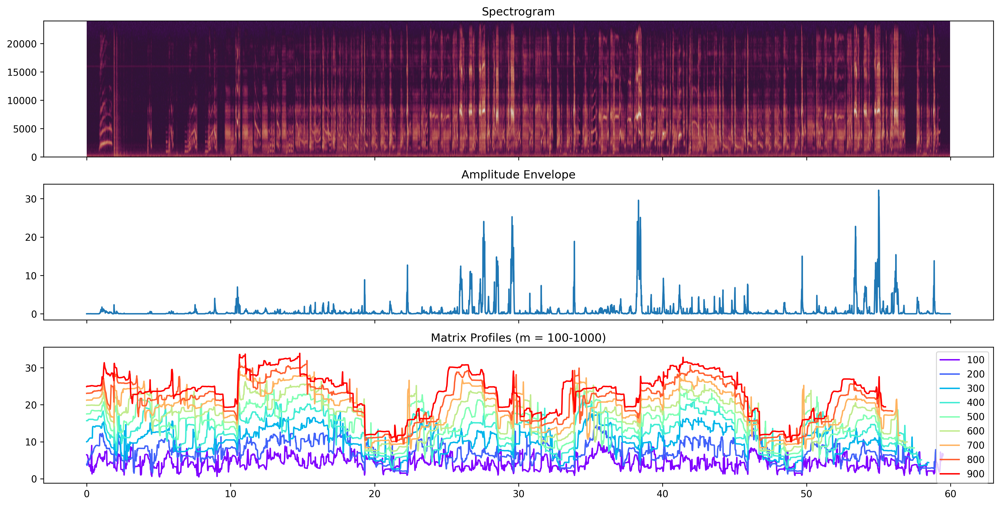

In [42]:
fig, axs = plt.subplots(3, sharex = True, figsize=(18, 9), dpi=300)
spec = axs[0].specgram(ae_df.waveform.values[0], Fs = 48000, cmap = 'twilight')
axs[0].title.set_text('Spectrogram')

amp = axs[1].plot(np.arange(0, len(tester)/200, step = 0.005), tester)
axs[1].title.set_text('Amplitude Envelope')

color = cm.rainbow(np.linspace(0,1,len(mpvalues)))
for n, mp, c in zip(np.arange(100, 1000, step = 100), mpvalues, color):
    if n in [ #exclusion list
        #100, 
        #200, 
        #300, 
        #400, 
        #500, 
        #600, 
        #700,
        #800,
        #900
    ]:
        continue
    mpfig = axs[2].plot(np.arange(0, len(mp)/200, step = 0.005), mp, c = c, label = str(n))
    axs[2].legend()
axs[2].title.set_text('Matrix Profiles (m = 100-1000)')

#plt.xlim(15, 25)

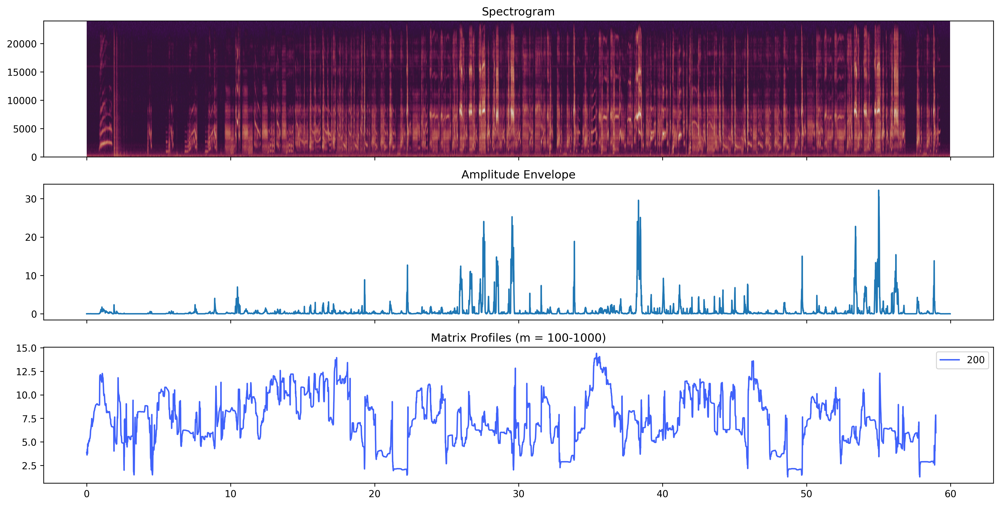

In [43]:
fig, axs = plt.subplots(3, sharex = True, figsize=(18, 9), dpi=300)
spec = axs[0].specgram(ae_df.waveform.values[0], Fs = 48000, cmap = 'twilight')
axs[0].title.set_text('Spectrogram')

amp = axs[1].plot(np.arange(0, len(tester)/200, step = 0.005), tester)
axs[1].title.set_text('Amplitude Envelope')

color = cm.rainbow(np.linspace(0,1,len(mpvalues)))
for n, mp, c in zip(np.arange(100, 1000, step = 100), mpvalues, color):
    if n in [ #exclusion list
        100, 
        #200, 
        300, 
        400, 
        500, 
        600, 
        700,
        800,
        900
    ]:
        continue
    mpfig = axs[2].plot(np.arange(0, len(mp)/200, step = 0.005), mp, c = c, label = str(n))
    axs[2].legend()
axs[2].title.set_text('Matrix Profiles (m = 100-1000)')

#plt.xlim(15, 25)

(15.0, 25.0)

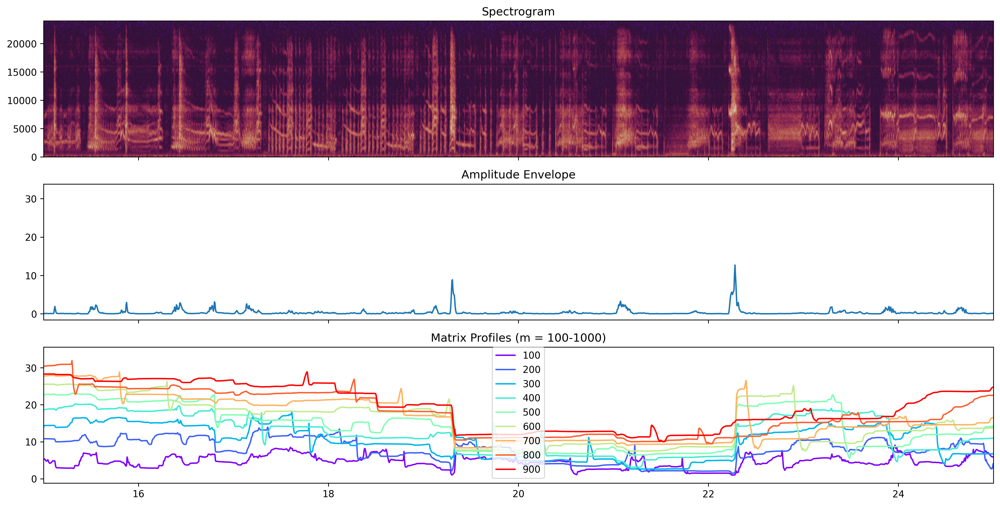

In [38]:
fig, axs = plt.subplots(3, sharex = True, figsize=(18, 9), dpi=300)
spec = axs[0].specgram(ae_df.waveform.values[0], Fs = 48000, cmap = 'twilight')
axs[0].title.set_text('Spectrogram')

amp = axs[1].plot(np.arange(0, len(tester)/200, step = 0.005), tester)
axs[1].title.set_text('Amplitude Envelope')

color = cm.rainbow(np.linspace(0,1,len(mpvalues)))
for n, mp, c in zip(np.arange(100, 1000, step = 100), mpvalues, color):
    mpfig = axs[2].plot(np.arange(0, len(mp)/200, step = 0.005), mp, c = c, label = str(n))
    axs[2].legend()
axs[2].title.set_text('Matrix Profiles (m = 100-1000)')

plt.xlim(15, 25)

(45.0, 55.0)

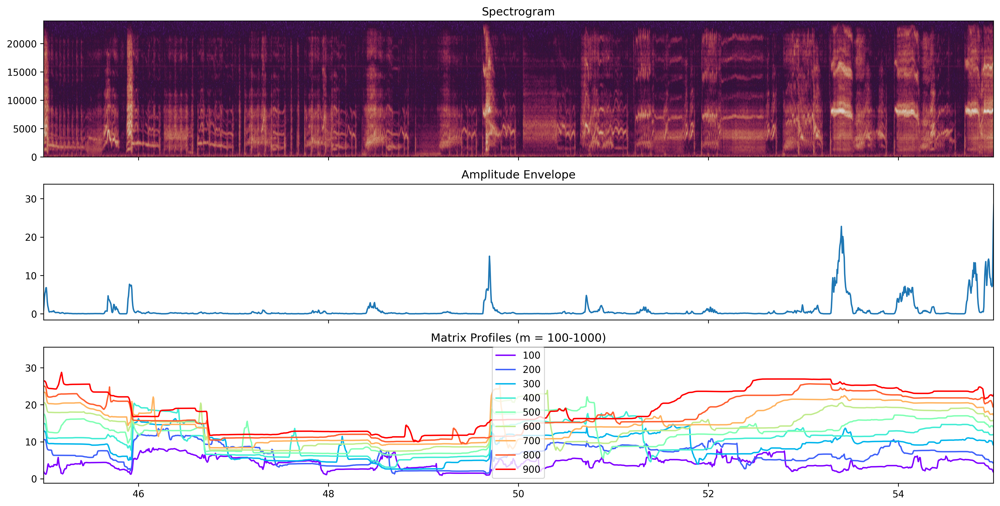

In [39]:
fig, axs = plt.subplots(3, sharex = True, figsize=(18, 9), dpi=300)
spec = axs[0].specgram(ae_df.waveform.values[0], Fs = 48000, cmap = 'twilight')
axs[0].title.set_text('Spectrogram')

amp = axs[1].plot(np.arange(0, len(tester)/200, step = 0.005), tester)
axs[1].title.set_text('Amplitude Envelope')

color = cm.rainbow(np.linspace(0,1,len(mpvalues)))
for n, mp, c in zip(np.arange(100, 1000, step = 100), mpvalues, color):
    mpfig = axs[2].plot(np.arange(0, len(mp)/200, step = 0.005), mp, c = c, label = str(n))
    axs[2].legend()
axs[2].title.set_text('Matrix Profiles (m = 100-1000)')

plt.xlim(45, 55)

## Run it for all of the amplitude envelopes

In [12]:
## quick define
def b1555_mp(amp_env, m = 200):
    mp = stumpy.gpu_stump(amp_env, m)
    mpvalues = mp.transpose()[0]
    return mpvalues

In [ ]:
import numpy as np
from joblib import Parallel, delayed
from tqdm.autonotebook import tqdm
n_jobs = 36 ## set up joblib parameters
verbose = 0

In [ ]:
with Parallel(n_jobs = n_jobs, verbose = verbose) as parallel:
    mps = parallel(
        delayed(b1555_mp)(
            amp_env
        ) 
        for amp_env in tqdm(ae_df.amp_env.values, desc = "Retrieving 1sec MP for all songs.")
    )

In [ ]:
ae_df['mp'] = mps

In [ ]:
ae_df

## Pickle dataframe

In [ ]:
from starling_rhythm.utils.paths import PROCESSED_DIR, ensure_dir

In [ ]:
SAVE_PATH = PROCESSED_DIR / 'starling_b1555_amp_envs200sr_MP.pickle'
ensure_dir(SAVE_PATH)

In [ ]:
ae_df.to_pickle(SAVE_PATH)